# Term Deposit Sale

### Goal:
Using the data collected from existing customers, build a model that will help the marketing team identify potential customers who are relatively more likely to subscribe term deposit and thus increase their hit ratio.

#### Data
The historical data for this project is available in file
https://archive.ics.uci.edu/ml/datasets/Bank+Marketing

##### Attributes related to Bank Client Data
1. age: Continuous feature
2. job: Type of job (management, technician, entrepreneur, blue-collar, etc.)
3. marital: marital status (married, single, divorced)
4. education: education level (primary, secondary, tertiary)
5. default: has credit in default?
6. housing: has housing loan?
7. loan: has personal loan?
8. balance in account

##### Attributes related to previous contact
9. contact: contact communication type
10. month: last contact month of year
11. day: last contact day of the month
12. duration: last contact duration, in seconds*

##### Other Attributes
13. campaign: number of contacts performed during this campaign and for this client
14. pdays: number of days that passed by after the client was last contacted from a previous campaign (-1 tells us the person has not been contacted or contact period is beyond 900 days)
15. previous: number of contacts performed before this campaign and for this client
16. poutcome: outcome of the previous marketing campaign

##### Output Variable / Target: 
17. Target: Tell us has the client subscribed a term deposit. (Yes, No)

In [1]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import pandas_profiling
import pydotplus as pydot
import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline
sns.set(color_codes=True)

from sklearn import tree
from sklearn.model_selection import train_test_split 
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.metrics import accuracy_score,f1_score,recall_score,precision_score, confusion_matrix # for model validation scores
from sklearn.feature_extraction.text import CountVectorizer  # DT does not take strings as input for the model fit step

from yellowbrick.classifier import ClassificationReport, ROCAUC

import missingno as msno_plot # for plotting missing values
from os import system

from IPython.display import display # for displaying multiple data frames in one output
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))
plt.style.use('ggplot')
pd.options.display.float_format = '{:,.4f}'.format

# 1 Basic EDA & Univariate Analysis 
1. Read the data (csv file)
2. Shape
3. Column Names (Attributes)
4. Info (Counts / Types)
5. Head & Tail (first 5 / last 5 rows of data)

## High Level View of Dataset

In [2]:
df = pd.read_csv("bank-full.csv")
print(df.columns)
print()
print(df.shape)
print()
print(df.info())
print()
print(df.size)
print()
pd.concat([df.head(5),df.tail(5)])

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'Target'],
      dtype='object')

(45211, 17)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int6

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no
45210,37,entrepreneur,married,secondary,no,2971,no,no,cellular,17,nov,361,2,188,11,other,no


## Reorder Attributes to Place Object Types on "Right of Dataframe"

In [3]:
newOrder=['age','balance','day','duration','campaign','pdays','previous','job','marital','education','default','housing','loan','contact','month','poutcome','Target']
df=df[newOrder]
pd.concat([df.head(5),df.tail(5)])

,age,balance,day,duration,campaign,pdays,previous,job,marital,education,default,housing,loan,contact,month,poutcome,Target
0,58,2143,5,261,1,-1,0,management,married,tertiary,no,yes,no,unknown,may,unknown,no
1,44,29,5,151,1,-1,0,technician,single,secondary,no,yes,no,unknown,may,unknown,no
2,33,2,5,76,1,-1,0,entrepreneur,married,secondary,no,yes,yes,unknown,may,unknown,no
3,47,1506,5,92,1,-1,0,blue-collar,married,unknown,no,yes,no,unknown,may,unknown,no
4,33,1,5,198,1,-1,0,unknown,single,unknown,no,no,no,unknown,may,unknown,no
45206,51,825,17,977,3,-1,0,technician,married,tertiary,no,no,no,cellular,nov,unknown,yes
45207,71,1729,17,456,2,-1,0,retired,divorced,primary,no,no,no,cellular,nov,unknown,yes
45208,72,5715,17,1127,5,184,3,retired,married,secondary,no,no,no,cellular,nov,success,yes
45209,57,668,17,508,4,-1,0,blue-collar,married,secondary,no,no,no,telephone,nov,unknown,no
45210,37,2971,17,361,2,188,11,entrepreneur,married,secondary,no,no,no,cellular,nov,other,no


## Overview of Numerical and Object-Type Attributes 

In [4]:
print("General information:")
df.info()
print()
print("Unique values per columns:")
df.nunique()

General information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   balance    45211 non-null  int64 
 2   day        45211 non-null  int64 
 3   duration   45211 non-null  int64 
 4   campaign   45211 non-null  int64 
 5   pdays      45211 non-null  int64 
 6   previous   45211 non-null  int64 
 7   job        45211 non-null  object
 8   marital    45211 non-null  object
 9   education  45211 non-null  object
 10  default    45211 non-null  object
 11  housing    45211 non-null  object
 12  loan       45211 non-null  object
 13  contact    45211 non-null  object
 14  month      45211 non-null  object
 15  poutcome   45211 non-null  object
 16  Target     45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB

Unique values per columns:


age            77
balance      7168
day            31
duration     1573
campaign       48
pdays         559
previous       41
job            12
marital         3
education       4
default         2
housing         2
loan            2
contact         3
month          12
poutcome        4
Target          2
dtype: int64

In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,"45,211.0000",40.9362,10.6188,18.0000,33.0000,39.0000,48.0000,95.0000
balance,"45,211.0000","1,362.2721","3,044.7658","-8,019.0000",72.0000,448.0000,"1,428.0000","102,127.0000"
day,"45,211.0000",15.8064,8.3225,1.0000,8.0000,16.0000,21.0000,31.0000
duration,"45,211.0000",258.1631,257.5278,0.0000,103.0000,180.0000,319.0000,"4,918.0000"
campaign,"45,211.0000",2.7638,3.0980,1.0000,1.0000,2.0000,3.0000,63.0000
pdays,"45,211.0000",40.1978,100.1287,-1.0000,-1.0000,-1.0000,-1.0000,871.0000
previous,"45,211.0000",0.5803,2.3034,0.0000,0.0000,0.0000,0.0000,275.0000


In [6]:
df.describe(include='object')

,job,marital,education,default,housing,loan,contact,month,poutcome,Target
count,45211,45211,45211,45211,45211,45211,45211,45211,45211,45211
unique,12,3,4,2,2,2,3,12,4,2
top,blue-collar,married,secondary,no,yes,no,cellular,may,unknown,no
freq,9732,27214,23202,44396,25130,37967,29285,13766,36959,39922


<b> General Findings & Comments: </b>

1. Records:45,211
2. Attributes: 17
3. Seven (7) Attributes of Type Int64
4. Ten (10) Attributes of Type Object that may need to be converted to Ordinal Type 
5. Attributes 'pdays' and 'previous' have equal Q1 and Q3

<b> Actions: </b>
1. Replace pdays' values of -1 with values of 0
2. Check for and Treat Missing Values
3. Check for and Treat outliers in Numerical Attributes

## Replace values in attributes of interest

In [7]:
# Replacing pdays value of -1 with value of 0
df['pdays']=df['pdays'].replace(-1, 0)
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,"45,211.0000",40.9362,10.6188,18.0000,33.0000,39.0000,48.0000,95.0000
balance,"45,211.0000","1,362.2721","3,044.7658","-8,019.0000",72.0000,448.0000,"1,428.0000","102,127.0000"
day,"45,211.0000",15.8064,8.3225,1.0000,8.0000,16.0000,21.0000,31.0000
duration,"45,211.0000",258.1631,257.5278,0.0000,103.0000,180.0000,319.0000,"4,918.0000"
campaign,"45,211.0000",2.7638,3.0980,1.0000,1.0000,2.0000,3.0000,63.0000
pdays,"45,211.0000",41.0152,99.7926,0.0000,0.0000,0.0000,0.0000,871.0000
previous,"45,211.0000",0.5803,2.3034,0.0000,0.0000,0.0000,0.0000,275.0000


## Check for Missing Values & Treat if necessary

### Missing Value Check

Percent of missing data:
age         0.0000
balance     0.0000
day         0.0000
duration    0.0000
campaign    0.0000
pdays       0.0000
previous    0.0000
job         0.0000
marital     0.0000
education   0.0000
default     0.0000
housing     0.0000
loan        0.0000
contact     0.0000
month       0.0000
poutcome    0.0000
Target      0.0000
dtype: float64

Visual representation of missing data:


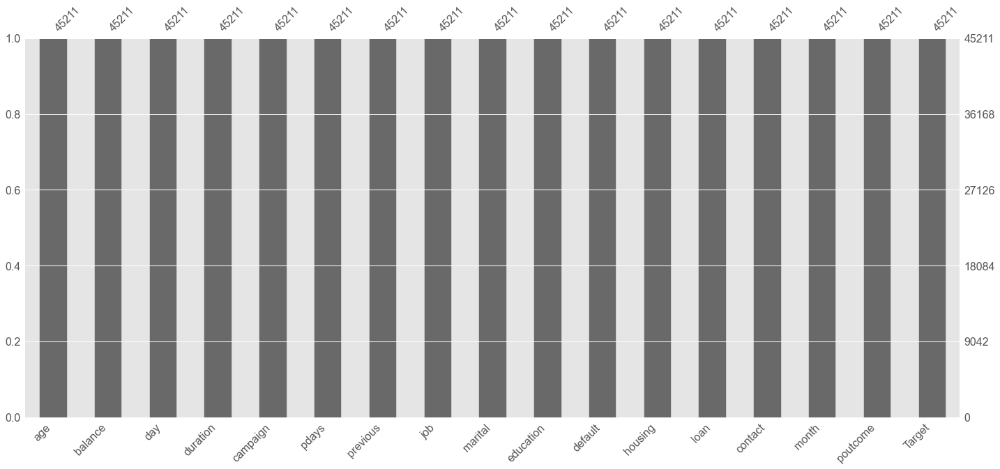

In [8]:
print("Percent of missing data:")
print(df.isnull().mean()*100)
print()
print("Visual representation of missing data:")
msno_plot.bar(df);

### Missing Value Treatement
None Necessary

## Check for Outliers & Treat if Necessary

### Check for Outliers in Numerical Attributes

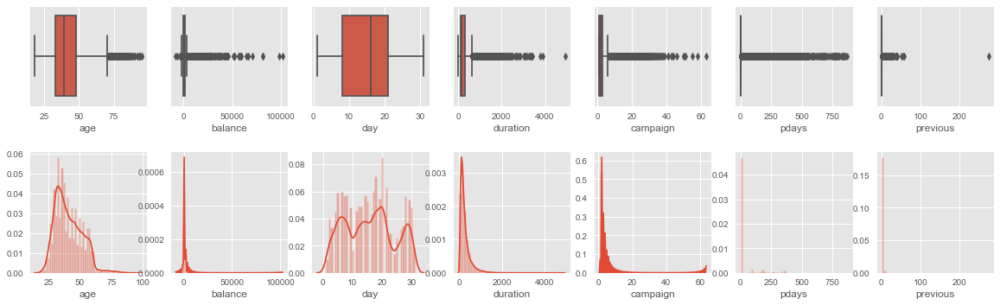

In [9]:
# check for outliers in attributes with continuous numerical values
col_num= ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']
plt.figure(figsize=(20,15))
pos = 1
for i in col_num:
    plt.subplot(6, 7, pos)
    sns.boxplot(df[i])
    pos += 1 
print()
for i in col_num:
    plt.subplot(5, 7, pos)
    sns.distplot(df[i])
    pos += 1 

In [10]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

age           15.0000
balance    1,356.0000
day           13.0000
duration     216.0000
campaign       2.0000
pdays          0.0000
previous       0.0000
dtype: float64


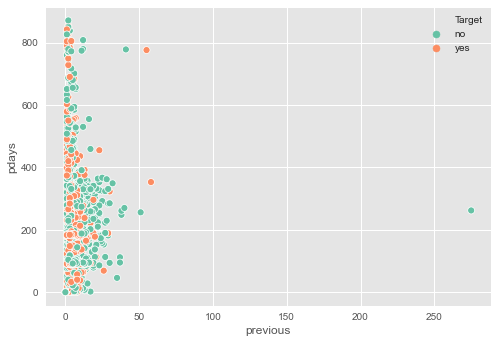

In [11]:
# focused analysis on attributes with Q1 = Q3 vs Target
sns.scatterplot(df['previous'], df['pdays'], hue=df['Target'], palette='Set2') 

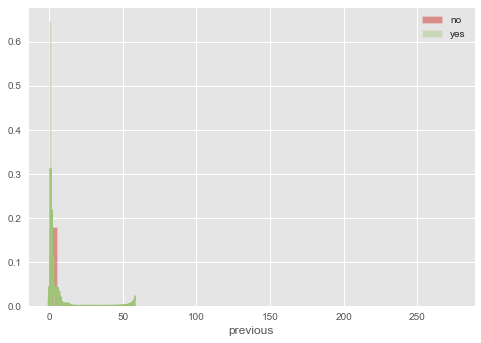

In [12]:
sns.distplot(df[df['Target']=="no"]['previous'],color='r',label="no")
sns.distplot(df[df['Target']=="yes"]['previous'],color='g',label="yes")
plt.legend()
plt.show()

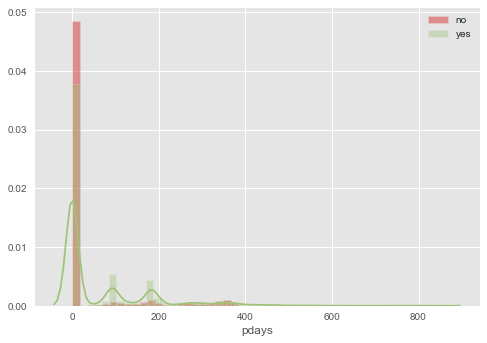

In [13]:
sns.distplot(df[df['Target']=="no"]['pdays'],color='r',label="no")
sns.distplot(df[df['Target']=="yes"]['pdays'],color='g',label='yes')
plt.legend()
plt.show()

In [14]:
df.groupby(['Target','pdays'])['previous'].value_counts()

Target  pdays  previous
no      0      0           33570
        1      1               4
               7               2
               3               1
               5               1
                           ...  
yes     804    1               1
        805    4               1
        828    2               1
        842    1               1
        854    2               1
Name: previous, Length: 3087, dtype: int64

In [15]:
df.groupby(['Target','previous'])['pdays'].value_counts()

Target  previous  pdays
no      0         0        33570
        1         370         45
                  182         35
                  364         35
                  350         29
                           ...  
yes     26        69           1
        29        189          1
        30        323          1
        55        776          1
        58        353          1
Name: pdays, Length: 3087, dtype: int64

Outlier Treatement for 'pdays' and 'previous' - remove columns entirely as > 90% of values where these are 0, "Target" = "yes", meaning that for more than 90% of time, a client subscribed without any prior / recent contact. 

For all other attributes, remove outliers per 1.5XQ1/Q3 rules.

### Remove Outliers from Numerical Attributes

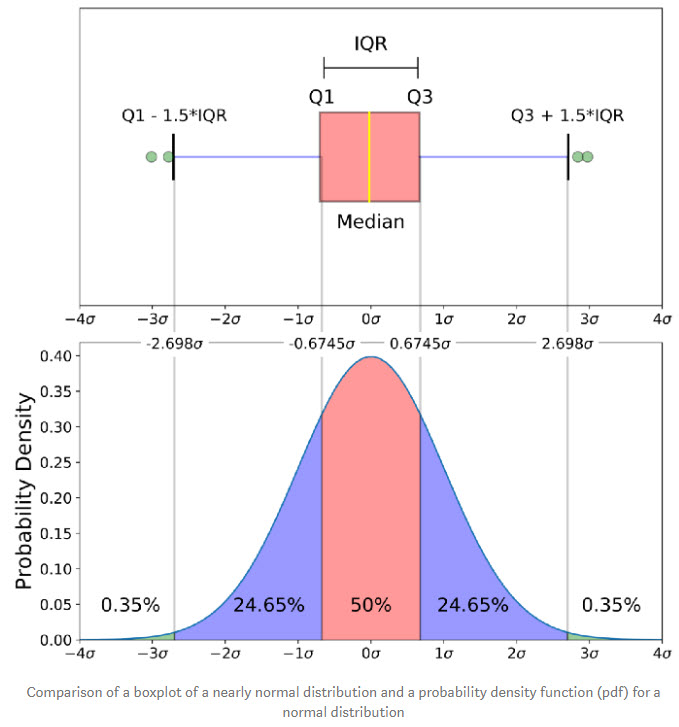

In [16]:
# image included for context 
# image acquired from blog post "Understanding Boxplots" by Michael Galarnyk at
# https://towardsdatascience.com/understanding-boxplots-5e2df7bcbd51

from IPython.display import Image
Image("boxplotOutliersDist.jpg") 

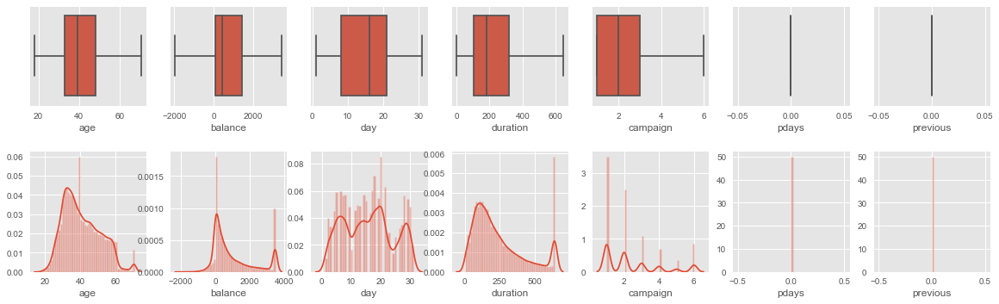

In [17]:
# remove outliers
for i in col_num:
    q1, q2, q3 = df[i].quantile([0.25,0.5,0.75])
    IQR = q3 - q1
    lower_cap=q1-1.5*IQR
    upper_cap=q3+1.5*IQR
    df[i]=df[i].apply(lambda x: upper_cap if x>(upper_cap) else (lower_cap if x<(lower_cap) else x))
    
# confirm outliers were removed
plt.figure(figsize=(20,15))
pos = 1
for i in col_num:
    plt.subplot(6, 7, pos)
    sns.boxplot(df[i])
    pos += 1 
print()
for i in col_num:
    plt.subplot(5, 7, pos)
    sns.distplot(df[i])
    pos += 1 

In [18]:
# drop 'pdays' and 'prevoius' columns
col_drop= ['pdays', 'previous']
df=df.drop(labels=col_drop, axis='columns')
df.describe().T
#df = df.drop(['pdays','previous'],axis=1)

,count,mean,std,min,25%,50%,75%,max
age,"45,211.0000",40.8682,10.3949,18.0000,33.0000,39.0000,48.0000,70.5000
balance,"45,211.0000",933.7070,"1,176.7654","-1,962.0000",72.0000,448.0000,"1,428.0000","3,462.0000"
day,"45,211.0000",15.8064,8.3225,1.0000,8.0000,16.0000,21.0000,31.0000
duration,"45,211.0000",234.9393,176.7499,0.0000,103.0000,180.0000,319.0000,643.0000
campaign,"45,211.0000",2.3922,1.6001,1.0000,1.0000,2.0000,3.0000,6.0000


<b> General Findings & Comments: </b>

1. No Missing Values --> No Treatment
2. Attributes 'pdays' and 'previous' have equal Q1 and Q3 and >90% of "Target"="yes" records derived from no previous or recent contacts made, so contact made as irrelevant to producing a "Target" of "yes" (client subscription). These columns were dropped. 
3. All other numerical attributes were treated for outliers. 

<b> Actions: </b>
1. Attribute Conversion - object to categorical
2. Categorical Attribute Encoding - ordinal -> numerical, yes/no --> binary 

<b>  Attributes that may require Binning (over 12 unique values)</b>
1. age
2. balance
3. day
4. duration
5. campaign

<b>  Attributes that may require conversion binary values of 0 or 1 for yes/no values</b>
1. default
2. housing
3. loan
4. Target

<b>  Attributes that may require ordinal/numerical encodings</b> 
1. month
2. poutcome

<b>  Attributes that may require one-hot encodings </b>
1. job
2. contact
3. marital
4. education

#### Attribute Type Conversion - Object to Categorical

In [19]:
for feature in df.columns: # Loop through all columns in the dataframe
    if df[feature].dtype == 'object': # Only apply for columns with categorical strings
        df[feature] = pd.Categorical(df[feature])# Replace strings with an integer
print(df.info())
pd.concat([df.head(5),df.tail(5)])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 15 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   age        45211 non-null  float64 
 1   balance    45211 non-null  float64 
 2   day        45211 non-null  int64   
 3   duration   45211 non-null  float64 
 4   campaign   45211 non-null  float64 
 5   job        45211 non-null  category
 6   marital    45211 non-null  category
 7   education  45211 non-null  category
 8   default    45211 non-null  category
 9   housing    45211 non-null  category
 10  loan       45211 non-null  category
 11  contact    45211 non-null  category
 12  month      45211 non-null  category
 13  poutcome   45211 non-null  category
 14  Target     45211 non-null  category
dtypes: category(10), float64(4), int64(1)
memory usage: 2.2 MB
None


,age,balance,day,duration,campaign,job,marital,education,default,housing,loan,contact,month,poutcome,Target
0,58.0000,"2,143.0000",5,261.0000,1.0000,management,married,tertiary,no,yes,no,unknown,may,unknown,no
1,44.0000,29.0000,5,151.0000,1.0000,technician,single,secondary,no,yes,no,unknown,may,unknown,no
2,33.0000,2.0000,5,76.0000,1.0000,entrepreneur,married,secondary,no,yes,yes,unknown,may,unknown,no
3,47.0000,"1,506.0000",5,92.0000,1.0000,blue-collar,married,unknown,no,yes,no,unknown,may,unknown,no
4,33.0000,1.0000,5,198.0000,1.0000,unknown,single,unknown,no,no,no,unknown,may,unknown,no
45206,51.0000,825.0000,17,643.0000,3.0000,technician,married,tertiary,no,no,no,cellular,nov,unknown,yes
45207,70.5000,"1,729.0000",17,456.0000,2.0000,retired,divorced,primary,no,no,no,cellular,nov,unknown,yes
45208,70.5000,"3,462.0000",17,643.0000,5.0000,retired,married,secondary,no,no,no,cellular,nov,success,yes
45209,57.0000,668.0000,17,508.0000,4.0000,blue-collar,married,secondary,no,no,no,telephone,nov,unknown,no
45210,37.0000,"2,971.0000",17,361.0000,2.0000,entrepreneur,married,secondary,no,no,no,cellular,nov,other,no


#### Conversions of Categories (text/string) to Numerical Values:

1. Create "binary attributes": Convert attributes with "yes" or "no" to binary (0 or 1)
2. Create "ordinal attributes": Convert attributes with text "values" of ordered categories to numerical
3. Create "one-hot-encoded attributes: Convert attributes with text "values" of no clear/direct order to one-hot endcoded variables

By Attribute:
1. default (binary)
2. housing (binary)
3. loan (binary)
4. Target (binary)
5. month (ordinal encoding)
6. poutcome (ordinal encoding)
7. job (one-hot-encoding)
8. contact (one-hot-encoding)
9. marital (one-hot-encoding)
10. education (one-hot-encoding)

In [20]:
# counts of distinct vaues in categorical attributes

print('For job:')
print(df.job.value_counts())
print()
print('For marital:')
print(df.marital.value_counts())
print()
print('For education:')
print(df.education.value_counts())
print()
print('For default:')
print(df.default.value_counts())
print()
print('For housing:')
print(df.housing.value_counts())
print()
print('For loan:')
print(df.loan.value_counts())
print()
print('For contact:')
print(df.contact.value_counts())
print()
print('For month:')
print(df.month.value_counts())
print()
print('For poutcome:')
print(df.poutcome.value_counts())
print()
print('For Target:')
print(df.Target.value_counts())
print()

# need to: create iterative function

For job:
blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64

For marital:
married     27214
single      12790
divorced     5207
Name: marital, dtype: int64

For education:
secondary    23202
tertiary     13301
primary       6851
unknown       1857
Name: education, dtype: int64

For default:
no     44396
yes      815
Name: default, dtype: int64

For housing:
yes    25130
no     20081
Name: housing, dtype: int64

For loan:
no     37967
yes     7244
Name: loan, dtype: int64

For contact:
cellular     29285
unknown      13020
telephone     2906
Name: contact, dtype: int64

For month:
may    13766
jul     6895
aug     6247
jun     5341
nov     3970
apr     2932
feb     2649
jan     1403
oct      738
sep      579
mar      477
dec      214
Name: month, dtype: 

In [21]:
df.pivot_table(index='job', columns='Target', values='age').astype('int')
#turning numbers into integers

Target,no,yes
job,,
admin.,39,39
blue-collar,40,38
entrepreneur,42,42
housemaid,46,48
management,40,39
retired,59,64
self-employed,40,38
services,38,37
student,26,25


In [22]:
df.pivot_table(index='job', columns='Target', values='age', aggfunc='count')

Target,no,yes
job,,
admin.,4540,631
blue-collar,9024,708
entrepreneur,1364,123
housemaid,1131,109
management,8157,1301
retired,1748,516
self-employed,1392,187
services,3785,369
student,669,269


In [23]:
df.pivot_table(index='marital', columns='Target', values='age').astype('int')

Target,no,yes
marital,,
divorced,45,48
married,43,46
single,33,32


In [24]:
df.pivot_table(index='marital', columns='Target', values='age', aggfunc='count')

Target,no,yes
marital,,
divorced,4585,622
married,24459,2755
single,10878,1912


In [25]:
df.pivot_table(index='education', columns='Target', values='age').astype('int')

Target,no,yes
education,,
primary,45,50
secondary,39,40
tertiary,39,39
unknown,44,44


In [26]:
df.pivot_table(index='education', columns='Target', values='age', aggfunc='count')

Target,no,yes
education,,
primary,6260,591
secondary,20752,2450
tertiary,11305,1996
unknown,1605,252


In [27]:
replaceStruct = {
                "month":       {"jan":1,"feb":2,"mar":3,"apr":4,"may":5,"jun":6,"jul":7,"aug":8,"sep":9,"oct":10,"nov":11,"dec":12}, 
                "poutcome":    {"failure": 0, "unknown": 1, "other": 2, "success": 3},            
                "default":     {"no": 1, "yes": 0 }, 
                "housing":     {"no": 0, "yes": 1 }, 
                "loan":        {"no": 0, "yes": 1 },
                "education":   {"unknown": 0, "primary": 1, "secondary": 2, "tertiary": 3 }, 
                #"marital":     {"divorced": 0, "single": 1, "married": 2 },
                "contact":     {"unknown": 0, "telephone": 1, "cellular": 2 },
                #"job":         {}
                "Target":      {"no": 0, "yes": 1 } 
                    }
ohe_cols=["job","marital"]
df=df.replace(replaceStruct)
df=pd.get_dummies(df, columns=ohe_cols)
df.info()
pd.concat([df.head(5),df.tail(5)])


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 28 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   age                45211 non-null  float64
 1   balance            45211 non-null  float64
 2   day                45211 non-null  int64  
 3   duration           45211 non-null  float64
 4   campaign           45211 non-null  float64
 5   education          45211 non-null  int64  
 6   default            45211 non-null  int64  
 7   housing            45211 non-null  int64  
 8   loan               45211 non-null  int64  
 9   contact            45211 non-null  int64  
 10  month              45211 non-null  int64  
 11  poutcome           45211 non-null  int64  
 12  Target             45211 non-null  int64  
 13  job_admin.         45211 non-null  uint8  
 14  job_blue-collar    45211 non-null  uint8  
 15  job_entrepreneur   45211 non-null  uint8  
 16  job_housemaid      452

,age,balance,day,duration,campaign,education,default,housing,loan,contact,...,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,job_unknown,marital_divorced,marital_married,marital_single
0,58.0000,"2,143.0000",5,261.0000,1.0000,3,1,1,0,0,...,0,0,0,0,0,0,0,0,1,0
1,44.0000,29.0000,5,151.0000,1.0000,2,1,1,0,0,...,0,0,0,0,1,0,0,0,0,1
2,33.0000,2.0000,5,76.0000,1.0000,2,1,1,1,0,...,0,0,0,0,0,0,0,0,1,0
3,47.0000,"1,506.0000",5,92.0000,1.0000,0,1,1,0,0,...,0,0,0,0,0,0,0,0,1,0
4,33.0000,1.0000,5,198.0000,1.0000,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,1
45206,51.0000,825.0000,17,643.0000,3.0000,3,1,0,0,2,...,0,0,0,0,1,0,0,0,1,0
45207,70.5000,"1,729.0000",17,456.0000,2.0000,1,1,0,0,2,...,1,0,0,0,0,0,0,1,0,0
45208,70.5000,"3,462.0000",17,643.0000,5.0000,2,1,0,0,2,...,1,0,0,0,0,0,0,0,1,0
45209,57.0000,668.0000,17,508.0000,4.0000,2,1,0,0,1,...,0,0,0,0,0,0,0,0,1,0
45210,37.0000,"2,971.0000",17,361.0000,2.0000,2,1,0,0,2,...,0,0,0,0,0,0,0,0,1,0


In [28]:
dfnum=df[['age', 'balance', 'day', 'duration', 'campaign']]
dfnum.describe().T

,count,mean,std,min,25%,50%,75%,max
age,"45,211.0000",40.8682,10.3949,18.0000,33.0000,39.0000,48.0000,70.5000
balance,"45,211.0000",933.7070,"1,176.7654","-1,962.0000",72.0000,448.0000,"1,428.0000","3,462.0000"
day,"45,211.0000",15.8064,8.3225,1.0000,8.0000,16.0000,21.0000,31.0000
duration,"45,211.0000",234.9393,176.7499,0.0000,103.0000,180.0000,319.0000,643.0000
campaign,"45,211.0000",2.3922,1.6001,1.0000,1.0000,2.0000,3.0000,6.0000


In [29]:
dfnum.nunique()

age           54
balance     4163
day           31
duration     644
campaign       6
dtype: int64

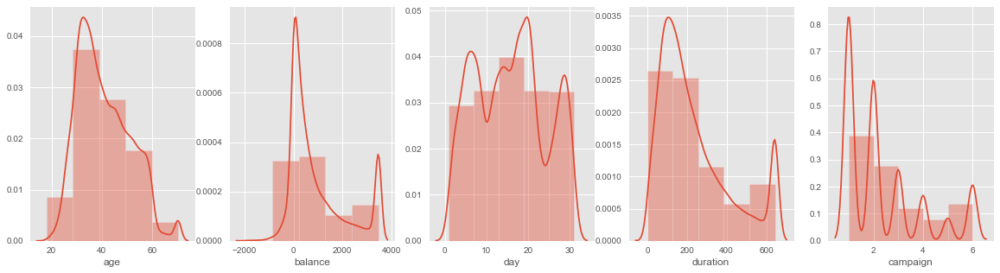

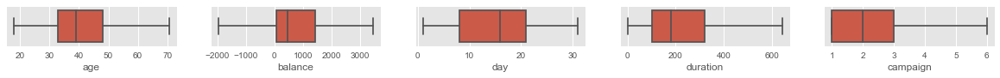

In [30]:
# distributions of numerical (continuous) attributes
fig, axs = plt.subplots(ncols = 5, figsize = (20, 5))
bins=5
sns.distplot(df['age'], bins=bins, ax = axs[0])
sns.distplot(df['balance'], bins=bins, ax = axs[1])
sns.distplot(df['day'], bins = bins, ax = axs[2])
sns.distplot(df['duration'], bins = bins, ax = axs[3])
sns.distplot(df['campaign'], bins=bins, ax = axs[4]);
#sns.distplot(df['pdays'], bins=30, ax = axs[5]);
#sns.distplot(df['previous'], bins=30,ax = axs[6]);
# Boxplots
col_num= ['age', 'balance', 'day', 'duration', 'campaign']
plt.figure(figsize=(29,5))
pos = 1
for i in col_num:
    plt.subplot(5, 7, pos)
    sns.boxplot(df[i])
    pos += 1 

In [31]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,"45,211.0000",40.8682,10.3949,18.0000,33.0000,39.0000,48.0000,70.5000
balance,"45,211.0000",933.7070,"1,176.7654","-1,962.0000",72.0000,448.0000,"1,428.0000","3,462.0000"
day,"45,211.0000",15.8064,8.3225,1.0000,8.0000,16.0000,21.0000,31.0000
duration,"45,211.0000",234.9393,176.7499,0.0000,103.0000,180.0000,319.0000,643.0000
campaign,"45,211.0000",2.3922,1.6001,1.0000,1.0000,2.0000,3.0000,6.0000
education,"45,211.0000",2.0605,0.7787,0.0000,2.0000,2.0000,3.0000,3.0000
default,"45,211.0000",0.9820,0.1330,0.0000,1.0000,1.0000,1.0000,1.0000
housing,"45,211.0000",0.5558,0.4969,0.0000,0.0000,1.0000,1.0000,1.0000
loan,"45,211.0000",0.1602,0.3668,0.0000,0.0000,0.0000,0.0000,1.0000
contact,"45,211.0000",1.3598,0.8980,0.0000,0.0000,2.0000,2.0000,2.0000


In [32]:
df.columns

Index(['age', 'balance', 'day', 'duration', 'campaign', 'education', 'default',
       'housing', 'loan', 'contact', 'month', 'poutcome', 'Target',
       'job_admin.', 'job_blue-collar', 'job_entrepreneur', 'job_housemaid',
       'job_management', 'job_retired', 'job_self-employed', 'job_services',
       'job_student', 'job_technician', 'job_unemployed', 'job_unknown',
       'marital_divorced', 'marital_married', 'marital_single'],
      dtype='object')

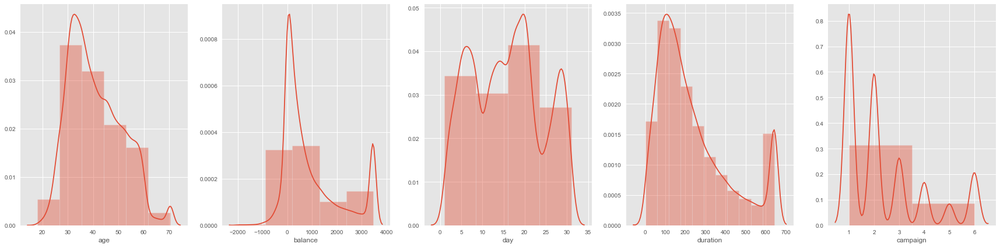

In [33]:
# distributions of numerical (continuous) attributes
fig, axs = plt.subplots(ncols = 5, figsize = (30, 7))
bins=5
sns.distplot(df['age'], bins=6, ax = axs[0])
sns.distplot(df['balance'], bins= bins,ax = axs[1])
sns.distplot(df['day'], bins = 4, ax = axs[2])
sns.distplot(df['duration'], bins = 11, ax = axs[3])
sns.distplot(df['campaign'], bins = 2,ax = axs[4]);
#sns.distplot(df['pdays'], bins=bins, ax = axs[5]);
#sns.distplot(df['previous'], bins=bins,ax = axs[6]);

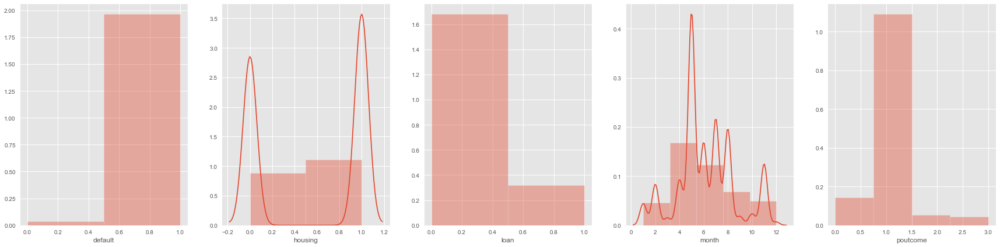

In [34]:
# distributions of ordinal attributes
fig, axs = plt.subplots(ncols = 5, figsize = (30, 7))
bins=5
sns.distplot(df['month'], bins = bins, ax = axs[3])
sns.distplot(df['default'], bins=2, ax = axs[0])
sns.distplot(df['housing'], bins = 2, ax = axs[1])
sns.distplot(df['loan'], bins = 2,ax = axs[2])
sns.distplot(df['poutcome'], bins = 4, ax = axs[4]); 


# 2 Bivariate & Multivariate Analysis:



In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 28 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   age                45211 non-null  float64
 1   balance            45211 non-null  float64
 2   day                45211 non-null  int64  
 3   duration           45211 non-null  float64
 4   campaign           45211 non-null  float64
 5   education          45211 non-null  int64  
 6   default            45211 non-null  int64  
 7   housing            45211 non-null  int64  
 8   loan               45211 non-null  int64  
 9   contact            45211 non-null  int64  
 10  month              45211 non-null  int64  
 11  poutcome           45211 non-null  int64  
 12  Target             45211 non-null  int64  
 13  job_admin.         45211 non-null  uint8  
 14  job_blue-collar    45211 non-null  uint8  
 15  job_entrepreneur   45211 non-null  uint8  
 16  job_housemaid      452

In [36]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,"45,211.0000",40.8682,10.3949,18.0000,33.0000,39.0000,48.0000,70.5000
balance,"45,211.0000",933.7070,"1,176.7654","-1,962.0000",72.0000,448.0000,"1,428.0000","3,462.0000"
day,"45,211.0000",15.8064,8.3225,1.0000,8.0000,16.0000,21.0000,31.0000
duration,"45,211.0000",234.9393,176.7499,0.0000,103.0000,180.0000,319.0000,643.0000
campaign,"45,211.0000",2.3922,1.6001,1.0000,1.0000,2.0000,3.0000,6.0000
education,"45,211.0000",2.0605,0.7787,0.0000,2.0000,2.0000,3.0000,3.0000
default,"45,211.0000",0.9820,0.1330,0.0000,1.0000,1.0000,1.0000,1.0000
housing,"45,211.0000",0.5558,0.4969,0.0000,0.0000,1.0000,1.0000,1.0000
loan,"45,211.0000",0.1602,0.3668,0.0000,0.0000,0.0000,0.0000,1.0000
contact,"45,211.0000",1.3598,0.8980,0.0000,0.0000,2.0000,2.0000,2.0000


#### Correlation plot - Understanding degree of association among different variables

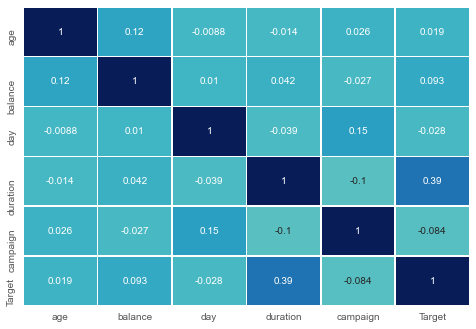

,age,balance,day,duration,campaign,Target
age,1.0000,0.1215,-0.0088,-0.0143,0.0258,0.0190
balance,0.1215,1.0000,0.0100,0.0419,-0.0265,0.0929
day,-0.0088,0.0100,1.0000,-0.0393,0.1530,-0.0283
duration,-0.0143,0.0419,-0.0393,1.0000,-0.1000,0.3907
campaign,0.0258,-0.0265,0.1530,-0.1000,1.0000,-0.0841
Target,0.0190,0.0929,-0.0283,0.3907,-0.0841,1.0000


In [37]:
# correlations of Numerical / Continuous attributes and Target
df1=df[['age', 'balance', 'day', 'duration', 'campaign','Target']]
sns.heatmap(df1.corr(),
            annot=True,
            linewidths=.5,
            center=0,
            cbar=False,
            cmap="YlGnBu")

plt.show()
df1.corr()

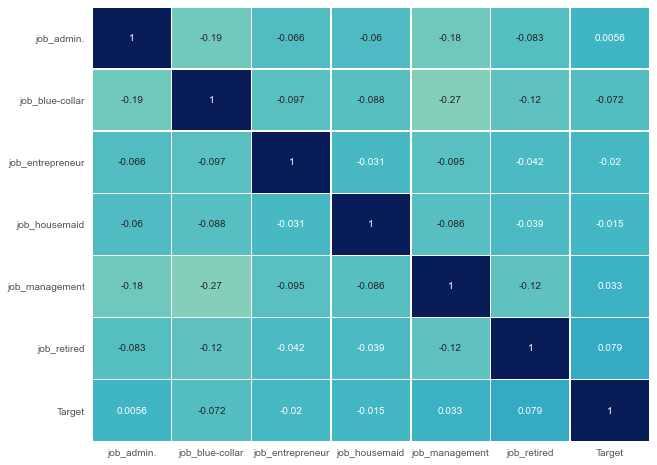

,job_admin.,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,Target
job_admin.,1.0000,-0.1882,-0.0663,-0.0603,-0.1848,-0.0825,0.0056
job_blue-collar,-0.1882,1.0000,-0.0966,-0.0880,-0.2694,-0.1203,-0.0721
job_entrepreneur,-0.0663,-0.0966,1.0000,-0.0310,-0.0949,-0.0423,-0.0197
job_housemaid,-0.0603,-0.0880,-0.0310,1.0000,-0.0864,-0.0386,-0.0152
job_management,-0.1848,-0.2694,-0.0949,-0.0864,1.0000,-0.1181,0.0329
job_retired,-0.0825,-0.1203,-0.0423,-0.0386,-0.1181,1.0000,0.0792
Target,0.0056,-0.0721,-0.0197,-0.0152,0.0329,0.0792,1.0000


In [38]:
# correlations of One Hot Encoded 'job' attributes and Target part 1
df2=df[['job_admin.', 'job_blue-collar','job_entrepreneur', 'job_housemaid', 'job_management', 'job_retired','Target']]
plt.figure(figsize=(10,8))
sns.heatmap(df2.corr(),
            annot=True,
            linewidths=.5,
            center=0,
            cbar=False,
            cmap="YlGnBu")

plt.show()
df2.corr()

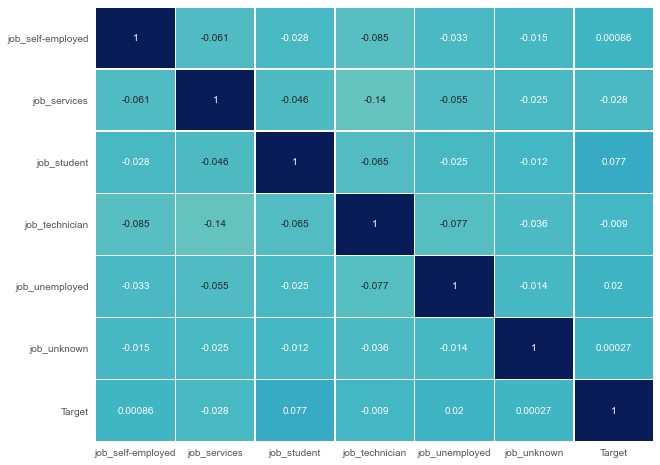

,job_self-employed,job_services,job_student,job_technician,job_unemployed,job_unknown,Target
job_self-employed,1.0000,-0.0605,-0.0277,-0.0855,-0.0328,-0.0152,0.0009
job_services,-0.0605,1.0000,-0.0463,-0.1430,-0.0548,-0.0255,-0.0279
job_student,-0.0277,-0.0463,1.0000,-0.0654,-0.0251,-0.0117,0.0769
job_technician,-0.0855,-0.1430,-0.0654,1.0000,-0.0774,-0.0360,-0.0090
job_unemployed,-0.0328,-0.0548,-0.0251,-0.0774,1.0000,-0.0138,0.0204
job_unknown,-0.0152,-0.0255,-0.0117,-0.0360,-0.0138,1.0000,0.0003
Target,0.0009,-0.0279,0.0769,-0.0090,0.0204,0.0003,1.0000


In [39]:
# correlations of One Hot Encoded 'job' attributes and Target part 2
df3=df[['job_self-employed', 'job_services', 'job_student', 'job_technician','job_unemployed', 'job_unknown','Target']]
plt.figure(figsize=(10,8))
sns.heatmap(df3.corr(),
            annot=True,
            linewidths=.5,
            center=0,
            cbar=False,
            cmap="YlGnBu")

plt.show()
df3.corr()

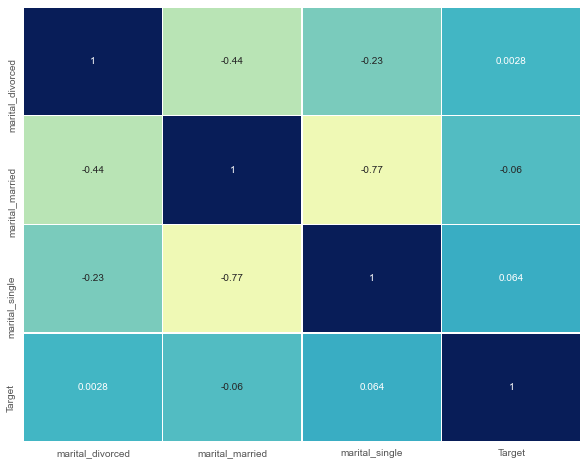

,marital_divorced,marital_married,marital_single,Target
marital_divorced,1.0000,-0.4436,-0.2266,0.0028
marital_married,-0.4436,1.0000,-0.7724,-0.0603
marital_single,-0.2266,-0.7724,1.0000,0.0635
Target,0.0028,-0.0603,0.0635,1.0000


In [40]:
# correlations of One Hot Encoded 'marital' attributes and Target 
df4=df[[ 'marital_divorced',
       'marital_married', 'marital_single','Target']]
plt.figure(figsize=(10,8))
sns.heatmap(df4.corr(),
            annot=True,
            linewidths=.5,
            center=0,
            cbar=False,
            cmap="YlGnBu")

plt.show()
df4.corr()

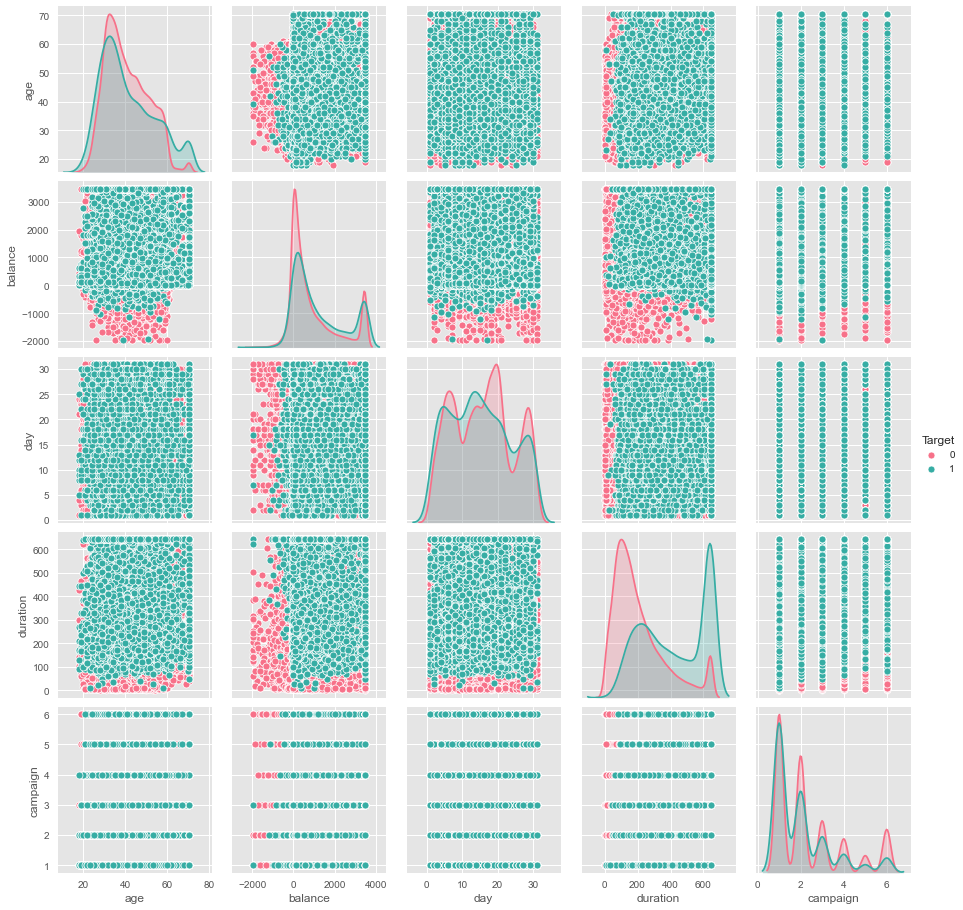

In [41]:
sns.pairplot(df1, hue="Target", palette="husl")

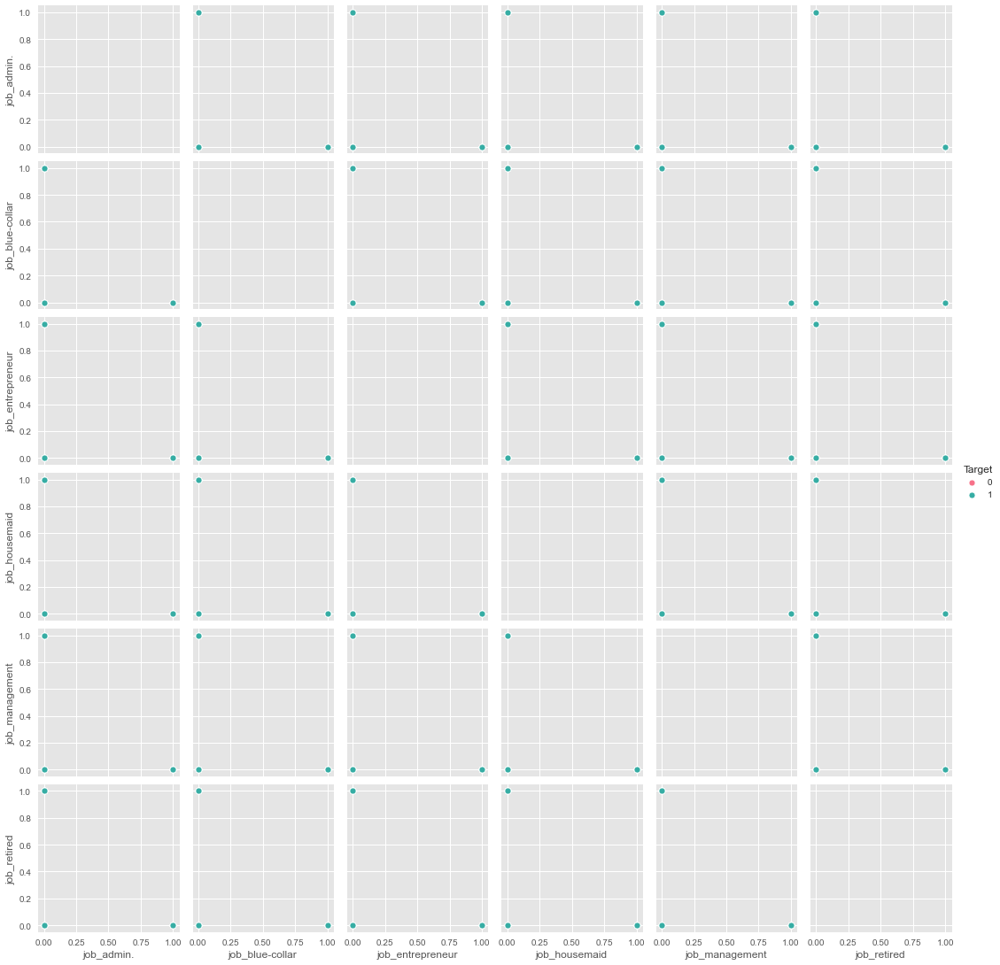

In [42]:
sns.pairplot(df2, hue="Target", palette="husl")

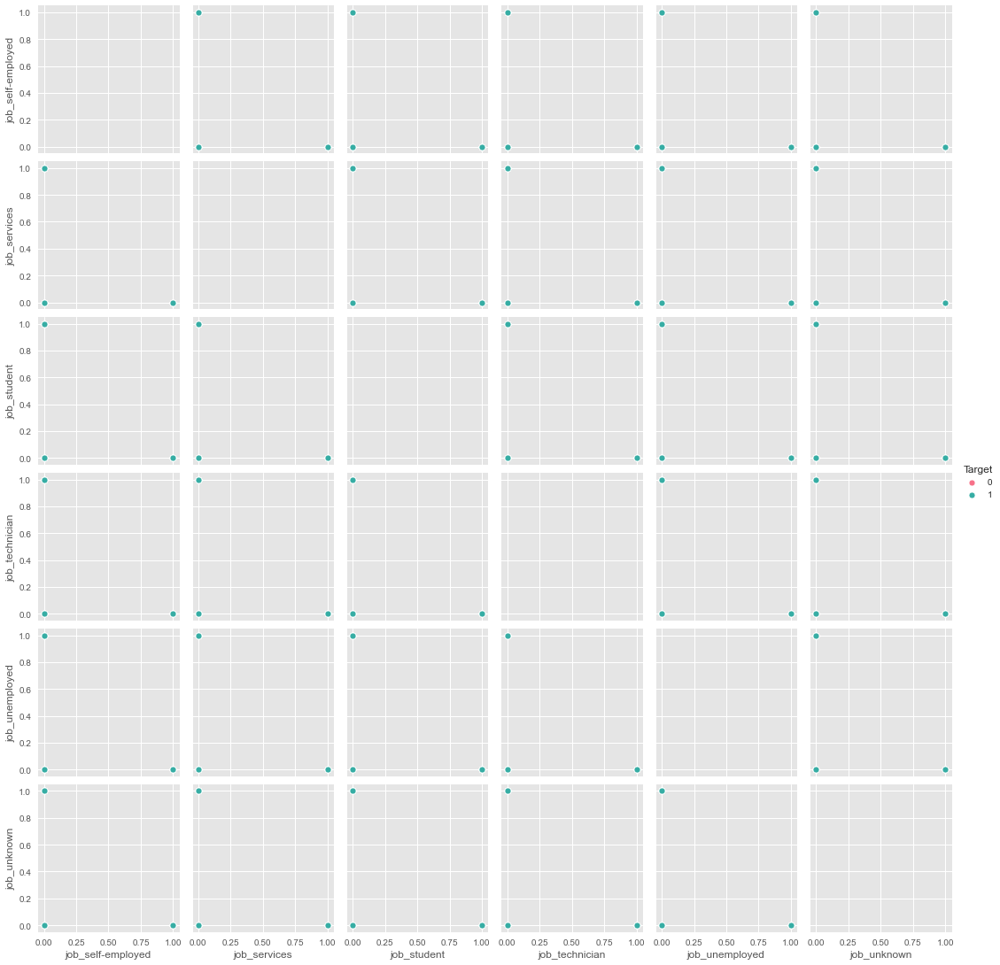

In [43]:
sns.pairplot(df3, hue="Target", palette="husl")

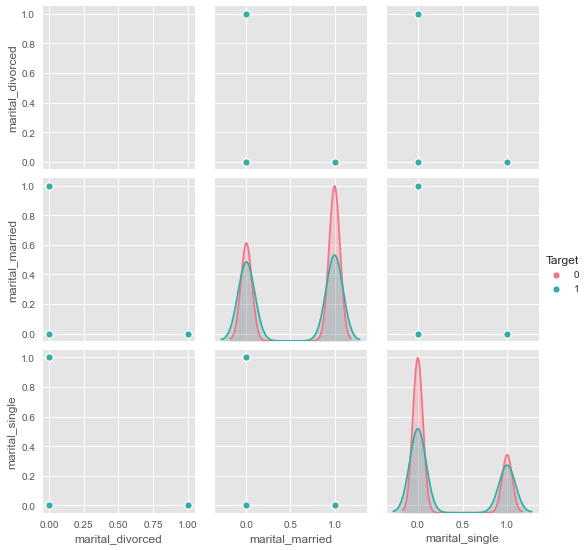

In [44]:
sns.pairplot(df4, hue="Target", palette="husl")

<b> General Findings & Comments </b>

1. Is there correlation between variables whose values are >0.8? No
2. Is there linear relationships between any two variables? No
3. Is there a strong correlation between any two variables? Only between Martial Single and Marital Married (inverse relationship as expected / ignore)
4. Is there a strong correlation between any independent variable and Target variable?  NO
5. "job" and "marital" related attributes have negligible impact on "Target" = "yes" --> drop all "job" and 'marital' related attributes 

# 3 Data Preparation: 
xxx

In [45]:
df.columns

Index(['age', 'balance', 'day', 'duration', 'campaign', 'education', 'default',
       'housing', 'loan', 'contact', 'month', 'poutcome', 'Target',
       'job_admin.', 'job_blue-collar', 'job_entrepreneur', 'job_housemaid',
       'job_management', 'job_retired', 'job_self-employed', 'job_services',
       'job_student', 'job_technician', 'job_unemployed', 'job_unknown',
       'marital_divorced', 'marital_married', 'marital_single'],
      dtype='object')

In [46]:
df = df.drop([ 'job_admin.', 'job_blue-collar', 'job_entrepreneur', 'job_housemaid',
       'job_management', 'job_retired', 'job_self-employed', 'job_services',
       'job_student', 'job_technician', 'job_unemployed', 'job_unknown',
       'marital_divorced', 'marital_married', 'marital_single'],axis=1)

In [47]:
df_logr=df # dataframe for logistic regression model
df_tree=df # dataframe for decision tree model
df_forest=df # dataframe for random forest model
df_bag=df # dataframe for bagging model
df_ada=df # dataframe for ada boost model
df_gradb=df # dataframe for gradient boost model

# 4 Logistic Regression Model: 


In [48]:
X = df_logr.drop(['Target'], axis=1)
Y = df_logr[['Target']]

##Split into training and test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.30,random_state=42)

In [49]:
print("{0:0.2f}% data is in training set".format((len(X_train)/len(df_logr.index)) * 100))
print("{0:0.2f}% data is in test set".format((len(X_test)/len(df_logr.index)) * 100))

70.00% data is in training set
30.00% data is in test set


In [50]:
from sklearn.metrics import confusion_matrix, recall_score, precision_score, f1_score, roc_auc_score, accuracy_score, log_loss
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(random_state=42);
logreg.fit(X_train, y_train);

In [51]:
logreg

LogisticRegression(random_state=42)

In [52]:
logreg.coef_

array([[-3.31150833e-02,  1.50516934e-04, -2.87564982e-02,
         5.01287633e-03, -4.67028517e-01, -2.65084249e-01,
        -1.90184388e-01, -4.75124288e-01, -1.24435778e-01,
         2.61195960e-01, -5.34225507e-02,  2.74882932e-01]])

In [53]:
logreg.intercept_

array([-0.20261478])

In [54]:
y_predict = logreg.predict(X_test)
y_predict = logreg.predict(X_train) #Prediction here are 0s and 1s
y_predict_prob = logreg.predict_proba(X_train) #to get probability values

In [55]:
y_predict = logreg.predict(X_train) # Prediction here are 0s and 1s
y_predict_prob = logreg.predict_proba(X_train)

In [56]:
## function to get confusion matrix in a proper format

def draw_cm( actual, predicted):
    cm = confusion_matrix(actual, predicted)
    print(cm)
    sns.heatmap(cm, annot=True,  fmt='.2f', xticklabels = [0,1] , yticklabels = [0,1] )
    plt.ylabel('Observed')
    plt.xlabel('Predicted')
    plt.show()

In [57]:
confusion_matrix(y_train,y_predict)

array([[27344,   612],
       [ 3032,   659]], dtype=int64)

Trainig accuracy 0.8848548045628337

Testing accuracy 0.88344146269537

Confusion Matrix
[[27344   612]
 [ 3032   659]]


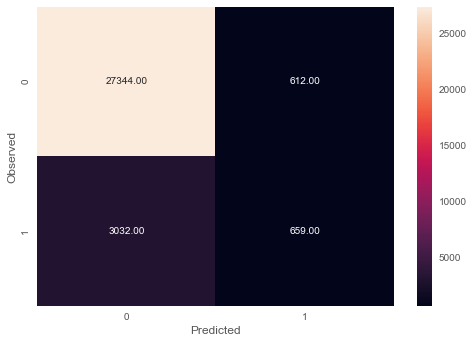

None

Recall: 0.17854240043348685

Precision: 0.5184893784421715

F1 Score: 0.26561870213623534



In [58]:
# Regression Score
print("Trainig accuracy",logreg.score(X_train,y_train))  
print()
print("Testing accuracy",logreg.score(X_test, y_test))
print()
print('Confusion Matrix')
print(draw_cm(y_train,y_predict))
print()
print("Recall:",recall_score(y_train,y_predict))
print()
print("Precision:",precision_score(y_train,y_predict))
print()
print("F1 Score:",f1_score(y_train,y_predict))
print()

In [59]:
print("Roc Auc Score:",roc_auc_score(y_train,y_predict))

Roc Auc Score: 0.5783254282894291


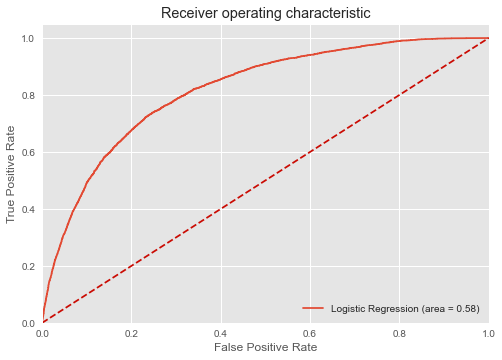

In [60]:
#AUC ROC curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

logit_roc_auc = roc_auc_score(y_train, logreg.predict(X_train))
fpr, tpr, thresholds = roc_curve(y_train, logreg.predict_proba(X_train)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [61]:
# print thresholds
fpr, tpr, thresholds =roc_curve(y_train, logreg.predict_proba(X_train)[:,1])
FPR=pd.DataFrame(fpr)
FPR.rename(columns = {0:'False Positive Rate'}, inplace = True)
TRP=pd.DataFrame(tpr)
TRP.rename(columns = {0:'True Positive Rate'}, inplace = True)
THRESHOLD=pd.DataFrame(thresholds)
THRESHOLD.rename(columns = {0:'Threshold'}, inplace = True)
result = pd.concat([FPR, TRP, THRESHOLD], axis=1, sort=False)
result.head(10)

,False Positive Rate,True Positive Rate,Threshold
0,0.0000,0.0000,1.8989
1,0.0000,0.0000,0.8989
2,0.0000,0.0033,0.8310
3,0.0001,0.0033,0.8294
4,0.0001,0.0049,0.8182
5,0.0001,0.0049,0.8123
6,0.0001,0.0054,0.8116
7,0.0002,0.0054,0.8112
8,0.0002,0.0057,0.8107
9,0.0002,0.0057,0.8106


,fpr,tpr,1-fpr,tf,thresholds
0,0.0000,0.0000,1.0000,-1.0000,1.8989
1,0.0000,0.0000,1.0000,-1.0000,0.8989
2,0.0000,0.0033,1.0000,-0.9967,0.8310
3,0.0001,0.0033,0.9999,-0.9967,0.8294
4,0.0001,0.0049,0.9999,-0.9951,0.8182


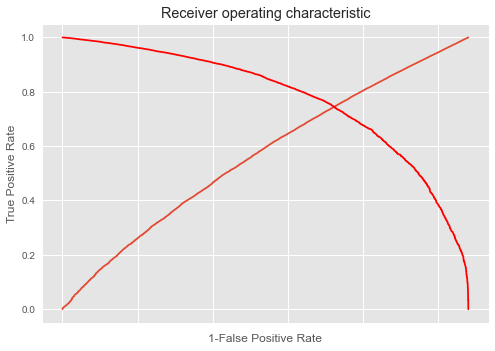

In [62]:
# Goal/Objective = threshold resulting in high TPR is high and FPR is low / where tpr - (1-fpr) is zero or near to zero is the optimal cut off point

import pylab as pl

i = np.arange(len(tpr)) # index for df
roc = pd.DataFrame({'fpr' : pd.Series(fpr, index=i),'tpr' : pd.Series(tpr, index = i), '1-fpr' : pd.Series(1-fpr, index = i), 'tf' : pd.Series(tpr - (1-fpr), index = i), 'thresholds' : pd.Series(thresholds, index = i)})
roc.iloc[(roc.tf-0).abs().argsort()[:1]]

# Plot tpr vs 1-fpr
fig, ax = pl.subplots()
pl.plot(roc['tpr'])
pl.plot(roc['1-fpr'], color = 'red')
pl.xlabel('1-False Positive Rate')
pl.ylabel('True Positive Rate')
pl.title('Receiver operating characteristic')
ax.set_xticklabels([])

display(roc.head())

In [63]:
roc[(roc['tpr']>0.6) & (roc['tpr']<0.7)].head(50)

,fpr,tpr,1-fpr,tf,thresholds
2728,0.1520,0.6001,0.8480,-0.2479,0.1972
2729,0.1522,0.6001,0.8478,-0.2477,0.1970
2730,0.1522,0.6004,0.8478,-0.2475,0.1970
2731,0.1522,0.6004,0.8478,-0.2474,0.1970
2732,0.1522,0.6007,0.8478,-0.2471,0.1969
2733,0.1525,0.6007,0.8475,-0.2468,0.1966
2734,0.1525,0.6009,0.8475,-0.2466,0.1966
2735,0.1529,0.6009,0.8471,-0.2462,0.1963
2736,0.1529,0.6012,0.8471,-0.2459,0.1963
2737,0.1533,0.6012,0.8467,-0.2455,0.1960


In [64]:
clf = LogisticRegression(random_state=42)
clf.fit(X_train, y_train)
THRESHOLD = 0.734359
preds = np.where(clf.predict_proba(X_test)[:,1] > THRESHOLD, 1, 0)
pd.DataFrame(data=[accuracy_score(y_test, preds), recall_score(y_test, preds),
                   precision_score(y_test, preds), roc_auc_score(y_test, preds)], 
             index=["accuracy", "recall", "precision", "roc_auc_score"])

,0
accuracy,0.8830
recall,0.0156
precision,0.6410
roc_auc_score,0.5072


In [65]:
logreg.get_params() # check parameters of logistic regression. If we dont specify the parameters in the model it takes default value

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': 42,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [66]:
# Run loop to check different values of 'solver'. Note that solver can only be used with l2, only 'liblinear' works with both 'l1' and 'l2','liblinear','sag','saga'

train_score=[]
test_score=[]
solver = ['newton-cg','lbfgs', 'liblinear','sag','saga']
for i in solver:
    model = LogisticRegression(random_state=42, penalty='l2', C = 0.75,solver=i)  # changing values of solver
    
    model.fit(X_train, y_train) 
    y_predict = model.predict(X_test) 
    
    train_score.append(round(model.score(X_train, y_train),3))
    test_score.append(round(model.score(X_test, y_test),3))
    
print(solver)
print()
print(train_score)
print()
print(test_score)

['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']

[0.894, 0.885, 0.894, 0.881, 0.881]

[0.889, 0.884, 0.889, 0.88, 0.88]


In [67]:
model = LogisticRegression(random_state=42,penalty='l2')  # change l1 penalty
model.fit(X_train, y_train)
y_predict = model.predict(X_test)     

print("Trainig accuracy",model.score(X_train,y_train))  
print()
print("Testing accuracy",model.score(X_test, y_test))

Trainig accuracy 0.8848548045628337

Testing accuracy 0.88344146269537


In [68]:
model = LogisticRegression(random_state=42, penalty='l2',class_weight='balanced') # changing class weight to balanced

model.fit(X_train, y_train) 

y_predict = model.predict(X_test)     

print("Trainig accuracy",model.score(X_train,y_train))  
print()
print("Testing accuracy",model.score(X_test, y_test))

Trainig accuracy 0.7777040477770405

Testing accuracy 0.7752138012385726


In [69]:
# Run loop to check different values of 'C'
train_score=[]                                 
test_score=[]
C = [0.01,0.1,0.25,0.5,0.75,1]
for i in C:
    model = LogisticRegression(random_state=42,penalty='l2', class_weight='balanced', C=i)  # changing values of C
    model.fit(X_train, y_train) 
    y_predict = model.predict(X_test)     
    train_score.append(round(model.score(X_train,y_train),3)) # appending training accuracy in a blank list for every run of the loop
    test_score.append(round(model.score(X_test, y_test),3))   # appending testing accuracy in a blank list for every run of the loop
    
print(C)
print()
print(train_score)
print()
print(test_score)

[0.01, 0.1, 0.25, 0.5, 0.75, 1]

[0.778, 0.776, 0.775, 0.776, 0.776, 0.778]

[0.775, 0.774, 0.774, 0.774, 0.775, 0.775]


Trainig accuracy 0.775239359180965

Testing accuracy 0.7738867590681215

Confusion Matrix
[[9192 2774]
 [ 293 1305]]


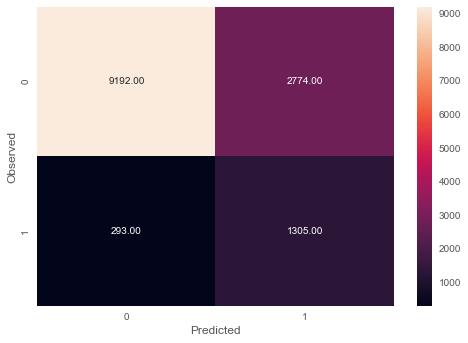

None

Recall: 0.8166458072590739

Precision: 0.31993135572444226

F1 Score: 0.459749867887969

Roc Auc Score: 0.792411153671322


In [70]:
# Final model
model = LogisticRegression(random_state=42,penalty='l2', class_weight='balanced',C=0.25)
model.fit(X_train, y_train)
y_predict = model.predict(X_test)

print("Trainig accuracy",model.score(X_train,y_train))  
print()
print("Testing accuracy",model.score(X_test, y_test))
print()
print('Confusion Matrix')
print(draw_cm(y_test,y_predict))
print()
print("Recall:",recall_score(y_test,y_predict))
print()
print("Precision:",precision_score(y_test,y_predict))
print()
print("F1 Score:",f1_score(y_test,y_predict))
print()
print("Roc Auc Score:",roc_auc_score(y_test,y_predict))

# 5 Decision Tree Model: 
Note - In Decision Trees, we need not remove highly correlated variables as nodes are divided into sub nodes using one independent variable only, hence even if two or more variables are highly correlated, the variable producing the highest information gain will be used for the analysis

In [71]:
# splitting data into training and test set for independent attributes
from sklearn.model_selection import train_test_split

features = [col for col in df_tree.columns if col != 'Target']

X_train, X_test, y_train, y_test = train_test_split(df_tree[features], df_tree['Target'], test_size=.3, random_state=22)
X_train.shape, X_test.shape

((31647, 12), (13564, 12))

### Building a Decision Tree

In [72]:
# Invoke the decision tree classifier function. 
# create gini and entropy methods of finding the split columns

model_entropy = DecisionTreeClassifier(criterion='entropy', random_state=42)
model_gini = DecisionTreeClassifier(criterion='gini', random_state=42)

In [73]:
model_entropy.fit(X_train, y_train)
model_gini.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [74]:
treeObj = model_entropy.tree_
print ('Total Nodes:',treeObj.node_count)
print('Depth:',model_entropy.get_depth())
print('Total Leaves:',model_entropy.get_n_leaves())

Total Nodes: 5533
Depth: 42
Total Leaves: 2767


In [75]:
treeObj = model_gini.tree_
print ('Total Nodes:',treeObj.node_count)
print('Depth:',model_gini.get_depth())
print('Total Leaves:',model_gini.get_n_leaves())

Total Nodes: 5643
Depth: 39
Total Leaves: 2822


In [76]:
print("Entropy Model Train: %.2f" % model_entropy.score(X_train, y_train))  # performance on train data
print("Entropy Model Test: %.2f" % model_entropy.score(X_test, y_test))  # performance on test data
print("Gini Model Train: %.2f" % model_gini.score(X_train, y_train))  # performance on train data
print("Gini Model Test: %.2f" % model_gini.score(X_test, y_test))  # performance on test data

Entropy Model Train: 1.00
Entropy Model Test: 0.87
Gini Model Train: 1.00
Gini Model Test: 0.88


### Findings

1. There is a high degree of overfitting in the model due to which the test accuracy drops drastically. This shows why decision trees are prone to overfitting. 

2. Regularize/prune the decision tree by limiting the max. depth of trees and print the accuracy.

3. There is no statistical significance on the values of depth and minimum samples that is considered below. The idea is to prune a tree and check how pruning impacts accuarcy.

In [77]:
clf_pruned = DecisionTreeClassifier(criterion = "gini", max_depth=5, min_samples_leaf=5, random_state=42)
clf_pruned.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=5, min_samples_leaf=5, random_state=42)

In [78]:
print("Train: %.2f" % clf_pruned.score(X_train, y_train))  # performance on train data
print("Test: %.2f" % clf_pruned.score(X_test, y_test))  # performance on test data

Train: 0.90
Test: 0.90


### Visualizing the tree

In [79]:
import io
from io import StringIO
from sklearn.tree import export_graphviz
from IPython.display import Image  
import pydotplus
import graphviz


feature_cols = X_train.columns

In [80]:
dot_data = StringIO()

export_graphviz(clf_pruned, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['5','6','8'])

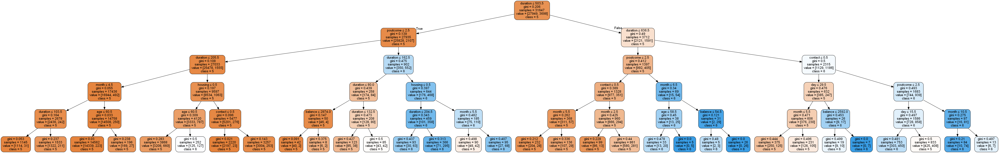

In [81]:
from pydotplus import graph_from_dot_data
#(graph, ) = graph_from_dot_data(dot_data.getvalue())
graph = graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [82]:
preds_train = clf_pruned.predict(X_train)
preds_test = clf_pruned.predict(X_test)

acc_DT = accuracy_score(y_test, preds_test)

### Decision tree performance

In [83]:
# Confusion matrix
pd.crosstab(y_test, preds_test, rownames=['Actual'], colnames=['Predicted'])

Predicted,0,1
Actual,,
0,11702,271
1,1103,488


In [84]:
# Model validation Score
print("Trainig accuracy",clf_pruned.score(X_train,y_train))  
print()

print("Testing accuracy",clf_pruned.score(X_test, y_test))
print()

print("----------------------Micro-----------------------------------------")
print("Recall:",recall_score(y_test,preds_test, average="micro"))
print()

print("Precision:",precision_score(y_test,preds_test, average="micro"))
print()

print("----------------------Macro-----------------------------------------")
print("Recall:",recall_score(y_test,preds_test, average="macro"))
print()

print("Precision:",precision_score(y_test,preds_test, average="macro"))
print()


Trainig accuracy 0.9008120832938351

Testing accuracy 0.8987024476555588

----------------------Micro-----------------------------------------
Recall: 0.8987024476555588

Precision: 0.8987024476555588

----------------------Macro-----------------------------------------
Recall: 0.6420455347809336

Precision: 0.7784065121959627



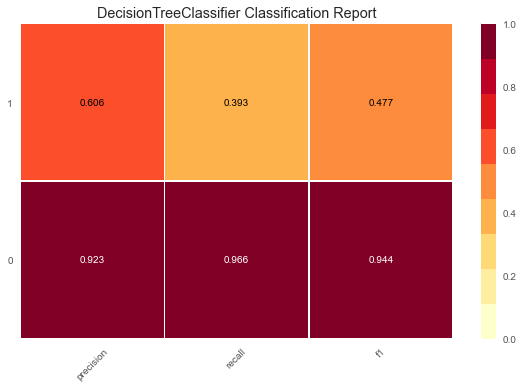

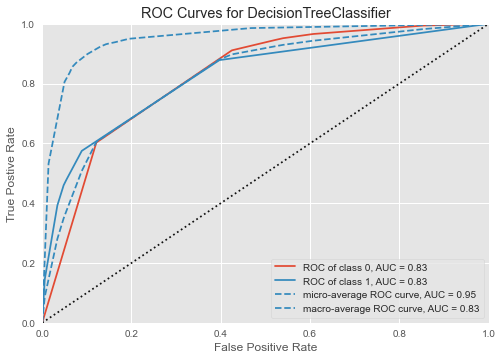

In [85]:
# Visualize model performance with yellowbrick library
viz = ClassificationReport(DecisionTreeClassifier(criterion = "gini", max_depth=3, min_samples_leaf=4))
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

roc = ROCAUC(DecisionTreeClassifier(criterion = "gini", max_depth=3, min_samples_leaf=4))
roc.fit(X_train, y_train)
roc.score(X_test, y_test)
roc.show()

### The regualarized tree shows similar accuracy score for both training and test data, however accuracy doesn't improve much

In [86]:
## calculate feature importance

feat_importance = clf_pruned.tree_.compute_feature_importances(normalize=False)

feat_imp_dict = dict(zip(features, clf_pruned.feature_importances_))
feat_imp = pd.DataFrame.from_dict(feat_imp_dict, orient='index')
feat_imp.sort_values(by=0, ascending=False).head()

,0
duration,0.5547
poutcome,0.3028
housing,0.0526
age,0.0308
contact,0.0257


#### From the feature importance dataframe we can infer that duration, housing, contact_unknown, month, andage are the variables that impact Target

In [87]:
#Store the accuracy results for each model in a dataframe for final comparison
resultsDf = pd.DataFrame({'Method':['Decision Tree - Gini - Pruned'], 'accuracy': acc_DT})
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Decision Tree - Gini - Pruned,0.8987


# 6 Ensemble Model: 


 #### Apply the Random forest model and print the accuracy of Random forest Model

In [88]:
from sklearn.ensemble import RandomForestClassifier
rfcl = RandomForestClassifier(n_estimators = 10, max_samples=0.8, random_state=42)
rfcl = rfcl.fit(X_train, y_train)
rfcl

RandomForestClassifier(max_samples=0.8, n_estimators=10, random_state=42)

In [89]:
pred_RF = rfcl.predict(X_test)
acc_RF = accuracy_score(y_test, pred_RF)

In [90]:
tempResultsDf = pd.DataFrame({'Method':['Random Forest'], 'accuracy': [acc_RF]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Decision Tree - Gini - Pruned,0.8987
0,Random Forest,0.8967


In [91]:
## Calculating feature importance

feat_importance = rfcl.feature_importances_

feat_imp_dict = dict(zip(features, rfcl.feature_importances_))
feat_imp = pd.DataFrame.from_dict(feat_imp_dict, orient='index')
feat_imp.sort_values(by=0, ascending=False)

,0
duration,0.2832
balance,0.1338
age,0.1311
day,0.1165
poutcome,0.1014
month,0.0909
campaign,0.0429
education,0.0358
contact,0.0260
housing,0.0243


In [92]:
rfcl.estimators_[5]

DecisionTreeClassifier(max_features='auto', random_state=1201263687)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.292748 to fit



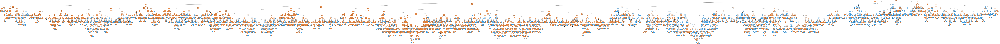

In [93]:
dot_data = StringIO()
export_graphviz(rfcl.estimators_[5], out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = features,class_names=['5','6','8'])
from pydotplus import graph_from_dot_data
#(graph, ) = graph_from_dot_data(dot_data.getvalue())
graph = graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

#### Apply the Bagging model and print the accuracy of Random forest Model

In [94]:
from sklearn.ensemble import BaggingClassifier

bgcl = BaggingClassifier(n_estimators=70, max_samples= .8, bootstrap=True, random_state=22)
#------bootstrap=True signifies that entire sample is not used to develop a tree
bgcl = bgcl.fit(X_train, y_train)

In [95]:
pred_BG = bgcl.predict(X_test)
acc_BG = accuracy_score(y_test, pred_BG)

In [96]:
tempResultsDf = pd.DataFrame({'Method':['Bagging'], 'accuracy': [acc_BG]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Decision Tree - Gini - Pruned,0.8987
0,Random Forest,0.8967
0,Bagging,0.9004


#### Apply the Boosting model and print the accuracy of Random forest Model

##### Ada-Boost 

In [97]:
from sklearn.ensemble import AdaBoostClassifier
abcl = AdaBoostClassifier(n_estimators = 100, learning_rate=0.1, random_state=22)
abcl = abcl.fit(X_train, y_train)

# n_estimator - The maximum number of estimators at which boosting is terminated. In case of perfect fit, the learning procedure is stopped early.

In [98]:
pred_AB =abcl.predict(X_test)
acc_AB = accuracy_score(y_test, pred_AB)

In [99]:
tempResultsDf = pd.DataFrame({'Method':['Adaboost'], 'accuracy': [acc_AB]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Decision Tree - Gini - Pruned,0.8987
0,Random Forest,0.8967
0,Bagging,0.9004
0,Adaboost,0.8944


##### Gradient-Boost 

In [100]:
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(n_estimators = 50, learning_rate = 0.1, random_state=22)
gbcl = gbcl.fit(X_train, y_train)

In [101]:
pred_GB = gbcl.predict(X_test)
acc_GB = accuracy_score(y_test, pred_GB)

In [102]:
tempResultsDf = pd.DataFrame({'Method':['Gradient Boost'], 'accuracy': [acc_GB]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Decision Tree - Gini - Pruned,0.8987
0,Random Forest,0.8967
0,Bagging,0.9004
0,Adaboost,0.8944
0,Gradient Boost,0.9015


In [103]:
x=model_entropy.predict_proba(X_train)
x[1,1]

0.0

In [104]:
x=clf_pruned.predict_proba(X_test)
x[250,1]

0.015313830517786018

##### Grid Search 

In [105]:
from sklearn.model_selection import GridSearchCV

params = {'criterion':['gini','entropy'],'max_samples':[0.7,0.75,0.6,0.8],'bootstrap':[True],'n_estimators':list(range(10,120,20))} #------------------Setting parameter values for Decision Tree

grid_search_model = GridSearchCV(RandomForestClassifier(random_state=42), params, verbose=1, cv=3) #---Cross validation is 3

grid_search_model.fit(X_train, y_train) 

Fitting 3 folds for each of 48 candidates, totalling 144 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 144 out of 144 | elapsed:  2.6min finished


GridSearchCV(cv=3, estimator=RandomForestClassifier(random_state=42),
             param_grid={'bootstrap': [True], 'criterion': ['gini', 'entropy'],
                         'max_samples': [0.7, 0.75, 0.6, 0.8],
                         'n_estimators': [10, 30, 50, 70, 90, 110]},
             verbose=1)

In [106]:
#-------------------------Getting the estimator the returns the best fit model based on accuracy score--------------------------
grid_search_model.best_estimator_

RandomForestClassifier(criterion='entropy', max_samples=0.8, n_estimators=50,
                       random_state=42)

In [107]:
grid_search_model.best_params_

{'bootstrap': True,
 'criterion': 'entropy',
 'max_samples': 0.8,
 'n_estimators': 50}

In [108]:
from sklearn.ensemble import RandomForestClassifier
rfcl = RandomForestClassifier(n_estimators = 70, random_state=42, criterion = 'entropy', max_samples=0.8)
rfcl = rfcl.fit(X_train, y_train)
display(rfcl)

RandomForestClassifier(criterion='entropy', max_samples=0.8, n_estimators=70,
                       random_state=42)

In [109]:
pred_RF = rfcl.predict(X_test)
acc_RF = accuracy_score(y_test, pred_RF)

In [110]:
tempResultsDf = pd.DataFrame({'Method':['Random Forest-Grid Search'], 'accuracy': [acc_RF]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Decision Tree - Gini - Pruned,0.8987
0,Random Forest,0.8967
0,Bagging,0.9004
0,Adaboost,0.8944
0,Gradient Boost,0.9015
0,Random Forest-Grid Search,0.9022


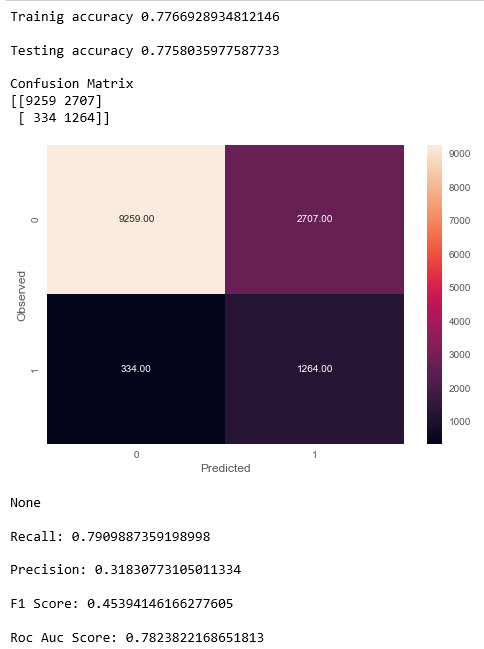

In [111]:
# screenshot of Final Logistic Regression model performance for reference / comparison against other models
from IPython.display import Image
Image("lr_finalModelScore.jpg") 

# 7 Model Comparisons: 

Highest Accuracy = "Random Forest - Grid Search"
Lowest Accuracy = Logistic Regression followed by Adaboost
Delta between Highest and Lowest Accuracy = .12

# 8 Conclusions: 
Run - Decision Tree Gini / Pruned Model for predeictions for its simplicity and interpretability compared to the complexity of all ensemble methods for marginal gains in performance. 